# <center>Messages in Autogen v0.4</center>

We can imaging messages as the way agent communicate - text our Friend.

When we communicate with the agents -----> sending a message when it responds ---> it too sends a message

TextMessage ImageMessage ToolMessage

In [13]:
import asyncio
from autogen_agentchat.agents import AssistantAgent
from autogen_ext.models.openai import OpenAIChatCompletionClient
from autogen_agentchat.messages import TextMessage, MultiModalMessage
from autogen_core import Image as AGImage

from PIL import Image
from io import BytesIO
import requests

from IPython.display import Markdown, display
from dotenv import load_dotenv
import os

load_dotenv()
google_api_key = os.getenv('GOOGLE_API_KEY')

model_client = OpenAIChatCompletionClient(
    model=os.getenv("GEMINI_MODEL"),
    base_url="https://generativelanguage.googleapis.com/v1beta/openai/",
    api_key=google_api_key,
    model_info={
        "vision": True,
        "function_calling": True,
        "json_output": True,
        "family": "unknown",
        "structured_output": False
    }
)

## Simplest Type of Message - TextMessage

In [14]:
agent = AssistantAgent(
    name="GK_Agent",
    model_client=model_client,
    system_message="You are a helpful assistant. Answer questions accurately."
)

In [9]:
async def test_text_message():
    text_msg = TextMessage(content = "what's your duty?", source='user')
    result = await agent.run(task=text_msg)
    print(result.messages[-1].content)
    
await test_text_message()


My primary duty is to be a helpful and harmless AI assistant.

I was designed by Google to assist you with a wide range of tasks by processing and generating human-like text. Think of me as a versatile tool.

Here's a breakdown of what that duty entails:

**1. To Provide Information and Answer Questions:**
*   I can answer your questions on countless topics, from science and history to current events and technical subjects.
*   I can explain complex concepts in a simple way.
*   I can act as a quick reference, like a dictionary or an encyclopedia.

**2. To Assist with Tasks:**
*   **Writing:** I can help you draft emails, write essays, create reports, compose resumes, and more.
*   **Summarizing:** I can condense long articles, documents, or books into key points.
*   **Brainstorming:** I can help you generate ideas for projects, business names, or creative stories.
*   **Coding:** I can help write, debug, and explain code in various programming languages.

**3. To Be a Creative Partne

## Multi Modal Messages

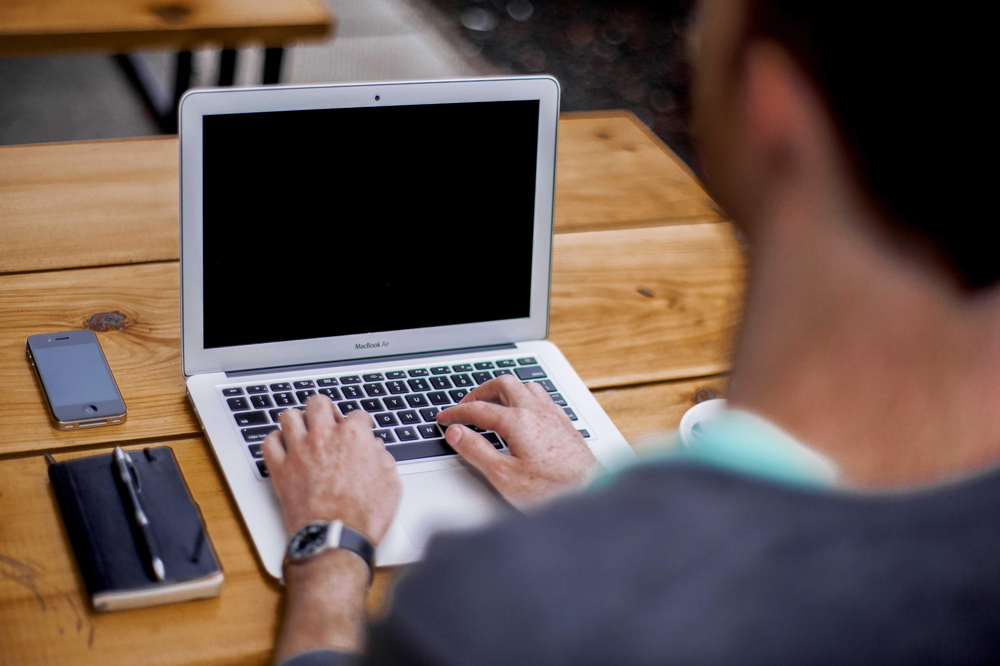

This is an over-the-shoulder photograph of a person working on a laptop at a wooden table.

Here are the key details:

*   **The Person:** We see the back of a person wearing a dark grey or blueish jacket over a light-colored, possibly mint green, collared shirt. Their hands are on the keyboard, actively typing. They have fair skin with some freckles on their hands and are wearing a watch with a dark strap on their left wrist.
*   **The Laptop:** The laptop is a silver Apple MacBook Air, which is identifiable by the text below the screen. The screen itself is black.
*   **The Setting:** The scene is set at a natural wood plank table, suggesting an outdoor cafe, patio, or a modern workspace. The background is softly blurred, keeping the focus on the person and their work setup.
*   **Other Items:** On the table to the left of the laptop, there is a smartphone (resembling an older iPhone model) and a small, closed black notebook with a pen on top. To the right, a white coffee cup is part

In [10]:
async def test_multi_modal():

    response = requests.get('https://fastly.picsum.photos/id/5/5000/3334.jpg?hmac=R_jZuyT1jbcfBlpKFxAb0Q3lof9oJ0kREaxsYV3MgCc') # 23 for the image of folks
    pil_image = Image.open(BytesIO(response.content))
    display(pil_image)
    ag_image = AGImage(pil_image)

    multi_modal_msg = MultiModalMessage(
        content = ['Please describe the image',ag_image],
        source='user'
    )

    result = await agent.run(task=multi_modal_msg)
    print(result.messages[-1].content)


await test_multi_modal()

In [11]:
import google.generativeai as genai
from PIL import Image

response = requests.get('https://fastly.picsum.photos/id/5/5000/3334.jpg?hmac=R_jZuyT1jbcfBlpKFxAb0Q3lof9oJ0kREaxsYV3MgCc')

image = Image.open(BytesIO(response.content))
model = genai.GenerativeModel(os.getenv("GEMINI_MODEL"))
response = model.generate_content(
    [
        "What is in the image?",
        image
    ]
)
print(response.text)

Based on the original image and the provided crops, here is a description of what is in the image:

This is an over-the-shoulder shot of a person sitting at a wooden table and working on a laptop.

*   **Main Subject:** A person, seen from behind, is actively typing on a silver **Apple MacBook Air**. Their hands are visible on the keyboard, and they are wearing a watch with a dark band on their left wrist.
*   **Technology:** Besides the MacBook Air, there is also a smartphone, which appears to be an older model of an iPhone, lying on the table to the left of the laptop.
*   **Other Objects:** Next to the smartphone, there is a small, closed black notebook with a pen on top of it. A small part of what might be a cup or mug is visible on the far right.
*   **Setting:** The person is at a light-colored wooden plank table, suggesting an outdoor or cafe setting. The background is softly blurred.
